In [2]:
%load_ext autoreload
%autoreload 2

import cv2
import h5py
import pandas as pd
import scanpy as sc 
import os
import ipdb
import openslide
import numpy as np
from tqdm import tqdm
import torch
import networkx as nx
import seaborn as sns
import matplotlib.pyplot as plt
from torch_geometric.utils import to_networkx
import networkx as nx
import scanpy as sc
import spatialleiden as sl
import squidpy as sq
from sklearn.cluster import KMeans
from prototype_visualization_utils import get_panther_encoder, visualize_categorical_heatmap, get_mixture_plot, get_default_cmap

/home/fywang/miniconda3/envs/spanther/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [21]:
# slide_id = "a194f77a-357f-11eb-a486-001a7dda7111"
# slide_id = "a195baf6-357f-11eb-8f0f-001a7dda7111"
# slide_id = "a195baf6-357f-11eb-8f0f-001a7dda7111" # 422
# slide_id = "a1956d05-357f-11eb-8d40-001a7dda7111" # 460
slide_id = "a197de24-357f-11eb-8e5f-001a7dda7111" # 471
# slide_id = "a196a529-357f-11eb-9739-001a7dda7111" # 719
# slide_id = "a195baf6-357f-11eb-8f0f-001a7dda7111" # 927
# slide_id = "a195bac2-357f-11eb-91f8-001a7dda7111"
wsi_dir = "/data1/r20user2/wsi_data/EBRAINS/WSIs"
wsi_path = os.path.join(wsi_dir, f"{slide_id}.ndpi")
# graph_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/superpatch_graph"
graph_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/superpatch_connected_ot_graph"
# graph_dir = "/data1/r20user2/wsi_data/TCGA_NSCLC/extracted_mag20x_patch256/uni_pt_patch_features/WSI_graph"
# graph_dir = "/data1/r20user2/wsi_data/TCGA_NSCLC/extracted_mag20x_patch256/uni_pt_patch_features/superpatch_connected_graph"
graph_path = os.path.join(graph_dir, f"{slide_id}.pt")
h5_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/h5_files"
with h5py.File(os.path.join(h5_dir, f"{slide_id}.h5"), "r") as f:
    print(list(f.keys()))
    coords = f["coords"][:]
    features = f["features"][:]
pt_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/pt_files"
pt_path = os.path.join(pt_dir, f"{slide_id}.pt")
pt_data = torch.load(pt_path)
graph_data = torch.load(graph_path)
slide_prototype_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/cluster_feats"
slide_prototype_path = os.path.join(slide_prototype_dir, f"{slide_id}.h5ad")
slide_prototype = sc.read_h5ad(slide_prototype_path)

connected_dir = "/data1/r20user2/wsi_data/EBRAINS/extracted_mag20x_patch256/uni_pt_patch_features/superpatch_connected_ot"
with h5py.File(os.path.join(connected_dir, f"{slide_id}.h5"), "r") as f:
    print(list(f.keys()))
    connected_coords = f["coords"][:]
    connected_features = f["features"][:]

['coords', 'features']


/tmp/ipykernel_3596076/3785939037.py:23: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  pt_data = torch.load(pt_path)
/tmp/ipykernel_3596076/3785939037.py:24: FutureWarning: 

['coords', 'features']


In [22]:
seed = 42

adata = sc.AnnData(features)
adata.obsm["spatial"] = coords

sc.pp.pca(adata, n_comps=64, random_state=seed)
sc.pp.neighbors(adata, random_state=seed)
sq.gr.spatial_neighbors(adata, coord_type="generic", n_neighs=8)
adata.obsp["spatial_connectivities"] = sl.distance2connectivity(
    adata.obsp["spatial_distances"]
)
sc.tl.leiden(adata, directed=False, random_state=seed)
sl.spatialleiden(adata, layer_ratio=1.8, directed=(False, True), seed=seed)

vis_level: 3
10752 12864
8.0


(-0.5, 10751.5, 12863.5, -0.5)

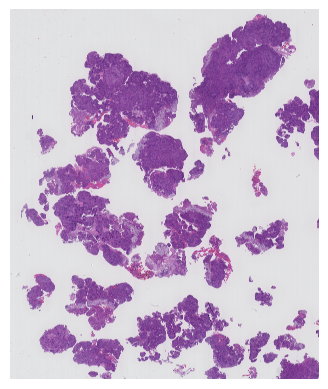

In [23]:
# plot topk subbgraphs and whole WSI
wsi = openslide.open_slide(wsi_path)
downscale = 8
vis_level = wsi.get_best_level_for_downsample(downscale)
print(f"vis_level: {vis_level}")
w, h = wsi.level_dimensions[vis_level]
print(w, h)
downsamples = wsi.level_downsamples[vis_level]
print(downsamples)

patch_size = 512
vis_patch_size = int(patch_size / downsamples)
whole_wsi = np.array(wsi.read_region((0, 0), level=vis_level, size=(w, h)).convert("RGB"))
plt.imshow(whole_wsi)
plt.axis("off")
# plt.savefig(f"WSI_{slide_id}.pdf", bbox_inches="tight")

In [24]:
# # fig, axes = plt.subplots(1, 3, figsize=(10, 5))
# fig, ax = plt.subplots(1, 1, figsize=(5, 5))
# idx = np.random.choice(len(coords))
# coord = coords[idx]
# patch = wsi.read_region((int(coord[0]), int(coord[1])), 0, (512, 512))
# plt.imshow(patch)
# plt.axis("off")

In [25]:
wsi.get_best_level_for_downsample(32)

5


Creating heatmap for: 
Top Left:  (0, 0) Bottom Right:  (86016, 102912)
Width: 2688, Height: 3216
Original Patch Size / Scaled Patch Size: (512, 512) / [16 16]


vis_level:  5
downsample:  32
region_size:  (2688, 3216)
total of 13938 patches


100%|██████████| 13938/13938 [00:01<00:00, 13288.79it/s]


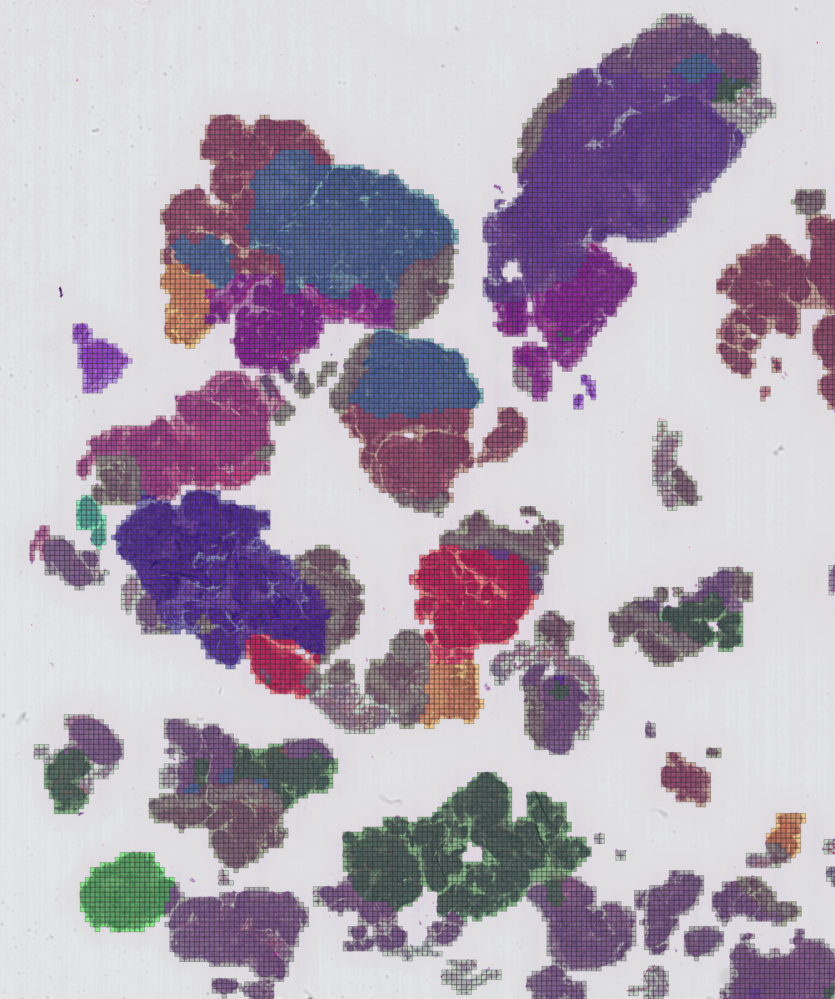

In [26]:
### Visualize the categorical heatmap and the GMM mixtures
cat_map = visualize_categorical_heatmap(
    wsi,
    coords, 
    adata.obs["spatialleiden"].to_numpy().astype(int), 
    label2color_dict=get_default_cmap(32),
    vis_level=wsi.get_best_level_for_downsample(32),
    patch_size=(patch_size, patch_size),
    alpha=0.4,
)

resized_cat_map = cat_map.resize((cat_map.width, cat_map.height))
# resized_cat_map.save(f"Spatial_Leiden_cluster_{slide_id}.pdf")
display(resized_cat_map)

In [27]:
# fig, ax = plt.subplots(1, 1, figsize=(13, 13))
# # ax.matshow(resized_cat_map)

# if hasattr(graph_data, "centroid"):
#     node_pos = graph_data.centroid.cpu().numpy()
# else:
#     node_pos = graph_data.pos.cpu().numpy()

# node_pos = node_pos * patch_size / 32

# if graph_data.edge_index is None:
#     row, col = graph_data.adj_t.to_dense().nonzero().t().contiguous()
#     edge_index = torch.stack([row, col], dim=0)
#     graph_data.edge_index = edge_index

# edges = graph_data.edge_index
# same_node = edges[0] == edges[1]
# edges = edges[:, ~same_node]
# graph_data.edge_index = edges
# G = to_networkx(graph_data, to_undirected=True)
# d = dict(enumerate(node_pos))

# deg = dict(G.degree)
# nodesize = 40
# nx.draw(G, pos=d, node_color='tab:blue', nodelist=d, node_size=[deg[k]*nodesize for k in deg], ax=ax)
# ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

In [10]:
# from sklearn.neighbors import KDTree

# tree = KDTree(coords)
# labels = adata.obs["spatialleiden"].to_numpy().astype(int)

# node_labels = []
# for node_p in node_pos:
#     dist, ind = tree.query(node_p.reshape(1, -1) * 32, k=1)
#     node_labels.append(labels[ind[0][0]])
#     # coord = coords[ind]
#     # ax.plot(node_p[0], node_p[1], 'ro', markersize=5)
#     # ax.plot(coord[0], coord[1], 'go', markersize=5)
#     # ax.plot([node_p[0], coord[0]], [node_p[1], coord[1]], 'g-')

In [11]:
# fig, ax = plt.subplots(1, 1, figsize=(13, 13))
# # ax.matshow(resized_cat_map)

# if hasattr(graph_data, "centroid"):
#     node_pos = graph_data.centroid.cpu().numpy()
# else:
#     node_pos = graph_data.pos.cpu().numpy()

# node_pos = node_pos * patch_size / 32

# if graph_data.edge_index is None:
#     row, col = graph_data.adj_t.to_dense().nonzero().t().contiguous()
#     edge_index = torch.stack([row, col], dim=0)
#     graph_data.edge_index = edge_index

# edges = graph_data.edge_index
# same_node = edges[0] == edges[1]
# edges = edges[:, ~same_node]
# graph_data.edge_index = edges
# G = to_networkx(graph_data, to_undirected=True)
# d = dict(enumerate(node_pos))

# # color_dict = dict(enumerate(node_labels))
# # node_colors = [i / 64 for i in range(node_labels)]
# deg = dict(G.degree)
# nodesize = 40
# nx.draw(G, pos=d, node_color=node_labels, nodelist=d, node_size=[deg[k]*nodesize for k in deg], ax=ax, cmap="hsv")
# ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)

In [13]:
# ### Visualize the categorical heatmap and the GMM mixtures
# cat_map = visualize_categorical_heatmap(
#     wsi,
#     coords, 
#     adata.obs["spatialleiden"].to_numpy().astype(int), 
#     label2color_dict=get_default_cmap(16),
#     vis_level=wsi.get_best_level_for_downsample(32),
#     patch_size=(patch_size, patch_size),
#     alpha=0,
# )

# resized_cat_map = cat_map.resize((cat_map.width, cat_map.height))
# # resized_cat_map.save(f"Spatial_Leiden_cluster_{slide_id}.pdf")
# display(resized_cat_map)